# Initial Conditions Optimization
## Plot History

In [188]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import matplotlib.style as style
style.use('fivethirtyeight')
import ray
import io
import os
from IPython.display import display, HTML, Markdown

In [189]:
# Download data
import get_data_v2 as gd
LoadData=False

if LoadData:
    gd.get_data()

Baixando arquivos brasil.io...
   state      popEst
0     AC    881935.0
1     AL   3337357.0
2     AM   4144597.0
3     AP    845731.0
4     BA  14873064.0
5     CE   9132078.0
6     DF   3015268.0
7     ES   4018650.0
8     GO   7018354.0
9     MA   7075181.0
10    MG  21168791.0
11    MS   2778986.0
12    MT   3484466.0
13    PA   8602865.0
14    PB   4018127.0
15    PE   9557071.0
16    PI   3273227.0
17    PR  11433957.0
18    RJ  17264943.0
19    RN   3506853.0
20    RO   1777225.0
21    RR    605761.0
22    RS  11377239.0
23    SC   7164788.0
24    SE   2298696.0
25    SP  45919049.0
26    TO   1572866.0


## Load Humor Sans, PlayFair Display and Roboto Fonts

In [190]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

def newFont(github_url,sizeFont):
    headers = {}
    headers[
        "User-Agent"
    ] = "Mozilla/5.0 (X11; Linux i686) AppleWebKit/537.17 (KHTML, like Gecko) Chrome/24.0.1312.27 Safari/537.17"
    url = github_url + '?raw=true'  # You want the actual file, not some html
    request = urllib.request.Request(url, headers=headers)
    response = urllib.request.urlopen(request)
    f = NamedTemporaryFile(delete=False, suffix='.ttf')
    f.write(response.read())
    f.close()    
    return fm.FontProperties(fname=f.name, size=sizeFont)

github_url = 'https://www.1001fonts.com/download/font/playfair-display.regular.ttf'
heading_font = newFont(github_url,20)

github_url = 'https://www.1001fonts.com/download/font/roboto.regular.ttf'
subtitle_font = newFont(github_url,16)

github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd/build/xkcd-Regular.otf'
comic_font = newFont(github_url,18)


# Main code

In [191]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [192]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,state,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,SP,2020-03-15,200,8000000.0,0,0,800,300,250,100,0.15,0.55,0.01
1,ES,2020-04-01,200,475000.0,0,0,50,250,50,100,0.15,0.65,0.01
2,MG,2020-04-01,200,1100000.0,0,0,200,250,40,100,0.15,0.55,0.01
3,RJ,2020-03-20,200,700000.0,0,0,800,250,50,100,0.15,0.50,0.01
4,CE,2020-03-20,200,800000.0,0,0,800,250,50,100,0.15,0.50,0.01
5,PE,2020-03-20,200,700000.0,0,0,800,250,100,100,0.15,0.50,0.01
6,BA,2020-03-20,200,700000.0,0,0,800,250,100,100,0.15,0.50,0.01
7,AM,2020-03-20,200,700000.0,0,0,800,250,100,100,0.15,0.50,0.01
8,PA,2020-03-20,200,700000.0,0,0,800,250,100,100,0.15,0.50,0.01
9,PI,2020-03-20,200,700000.0,0,0,800,250,100,100,0.15,0.50,0.01


## Select data set

In [193]:
opt=6
newModel=False

#select history file version, model and states
if opt==5:
    version=105
    newModel=True
    model="Yabox"
    states=dfparam.state
    
if opt==6:
    version=119
    newModel=True
    model="Yabox"
    states=dfparam.state
    
display(states)

0     SP
1     ES
2     MG
3     RJ
4     CE
5     PE
6     BA
7     AM
8     PA
9     PI
10    RR
11    AP
12    PR
13    SC
14    RS
Name: state, dtype: object

In [194]:
strFile="results/IC_optimizedStates"+str(version)+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot and Save Results

# Results for SP State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
126,3.289988e+09,2020-03-11,132,25252852,106,74,0.273,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
126,3.289988e+09,2020-03-11,132,25252852,106,74,0.2730,0
72,3.745704e+09,2020-03-15,241,27547626,136,156,0.2281,0
426,3.888238e+09,2020-03-11,172,38552547,179,74,0.2987,0
154,3.906077e+09,2020-03-12,176,23300760,179,170,0.3449,0
264,4.343876e+09,2020-03-16,129,38725778,191,232,0.4156,0


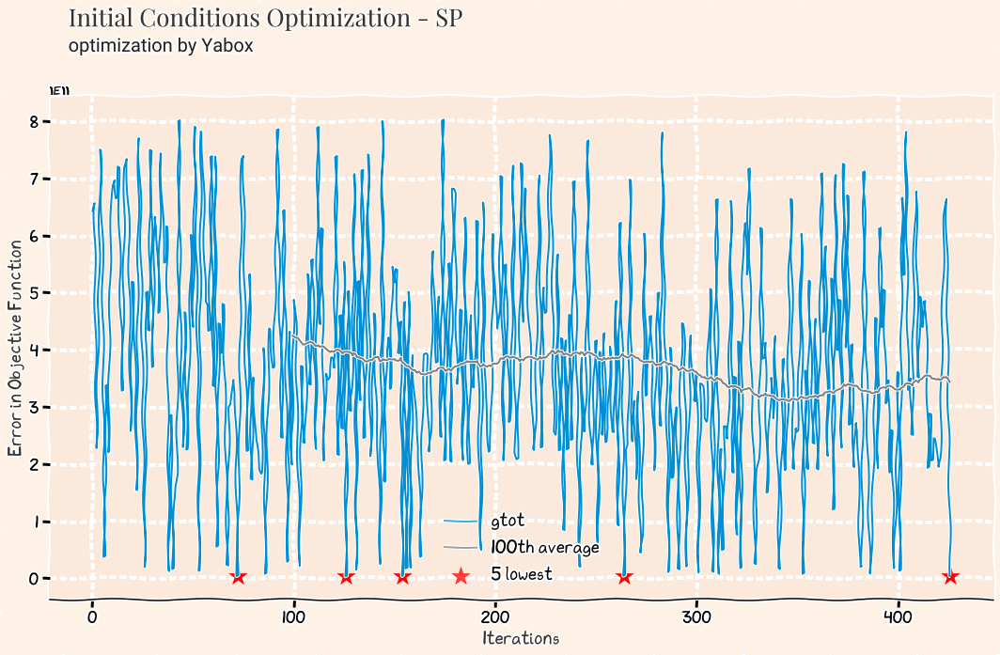

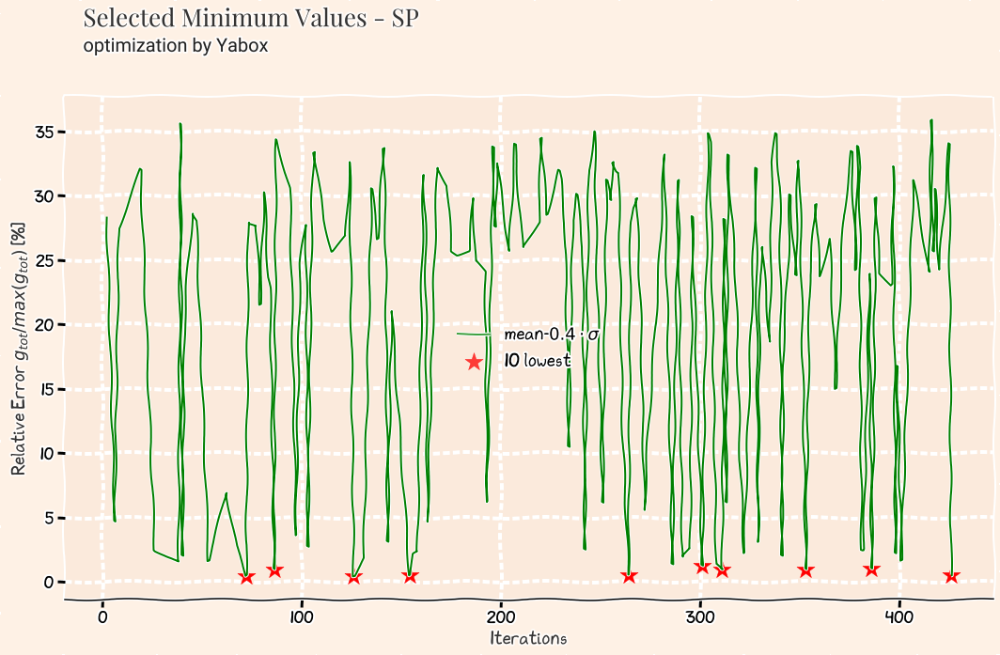

# Results for ES State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
421,3.938301e+07,2020-04-02,127,1741035,51,172,0.2065,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
421,3.938301e+07,2020-04-02,127,1741035,51,172,0.2065,0
142,4.666437e+07,2020-04-01,65,2794353,104,172,0.2969,0
310,5.386949e+07,2020-03-30,236,1902645,159,159,0.5189,0
356,5.834296e+07,2020-04-01,129,3154497,19,193,0.3132,0
217,5.858747e+07,2020-03-31,171,2419167,143,121,0.3335,0


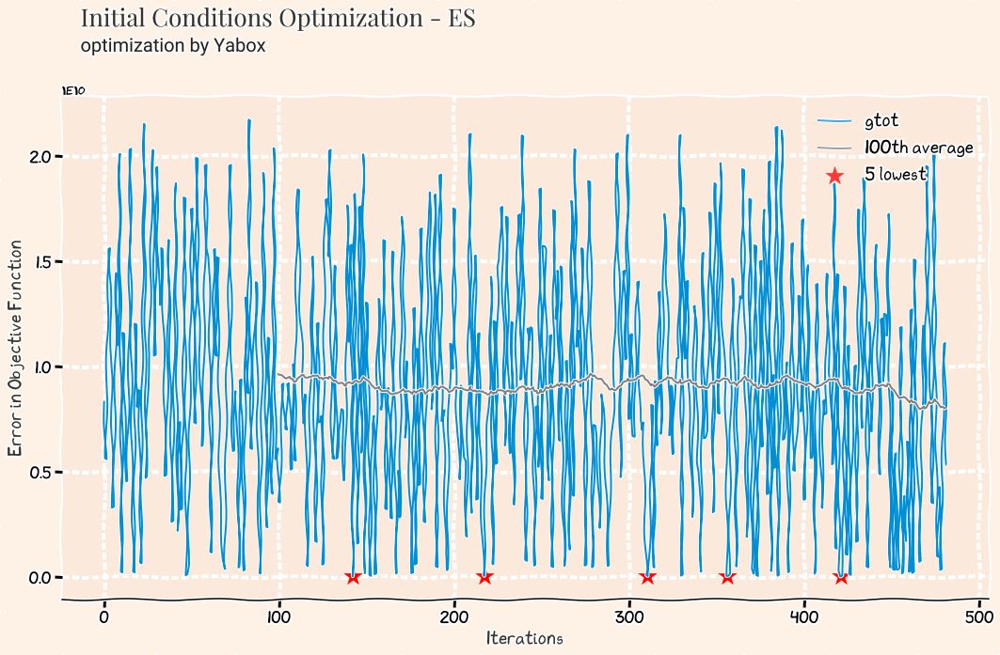

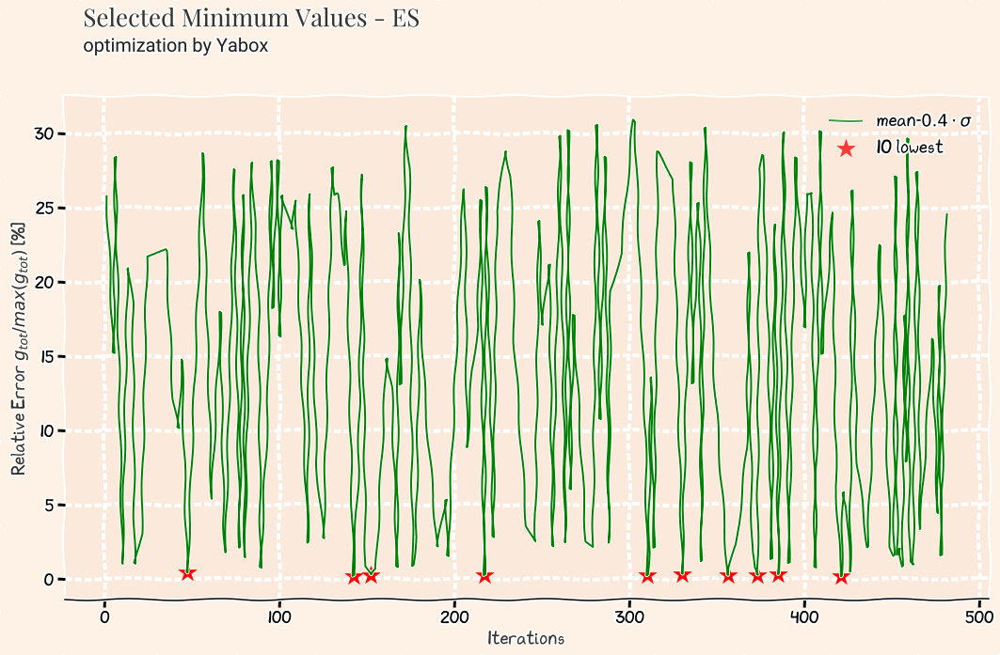

# Results for MG State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
221,8.974396e+07,2020-04-04,233,8771135,66,68,0.2471,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
221,8.974396e+07,2020-04-04,233,8771135,66,68,0.2471,0
215,2.002654e+08,2020-03-31,153,12192015,193,203,0.4580,0
15,6.295637e+08,2020-04-03,156,10210635,193,26,0.2071,0
279,6.496644e+08,2020-04-03,17,19589900,32,5,0.2795,0
130,6.871461e+08,2020-04-02,94,15044997,52,78,0.5802,0


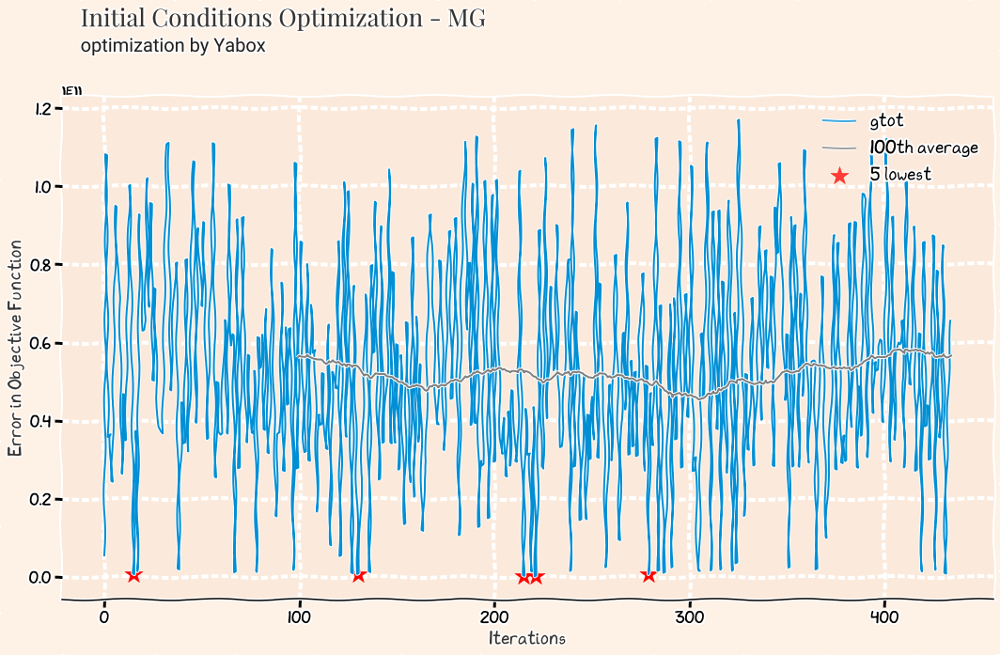

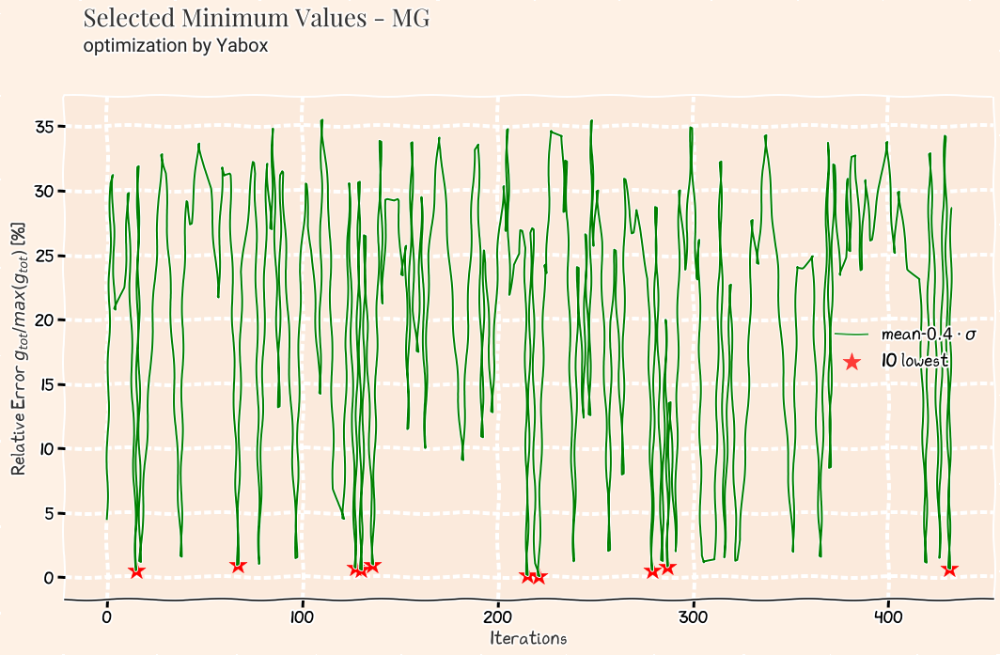

# Results for RJ State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
261,5.084919e+07,2020-03-20,98,16171937,149,124,0.5386,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
261,5.084919e+07,2020-03-20,98,16171937,149,124,0.5386,0
318,7.086745e+07,2020-03-21,27,13777959,140,220,0.7813,0
221,9.313598e+07,2020-03-20,94,6373647,111,240,0.2084,0
93,1.273961e+08,2020-03-18,66,11778637,249,19,0.3361,0
394,1.567412e+08,2020-03-22,209,15438878,97,91,0.5293,0


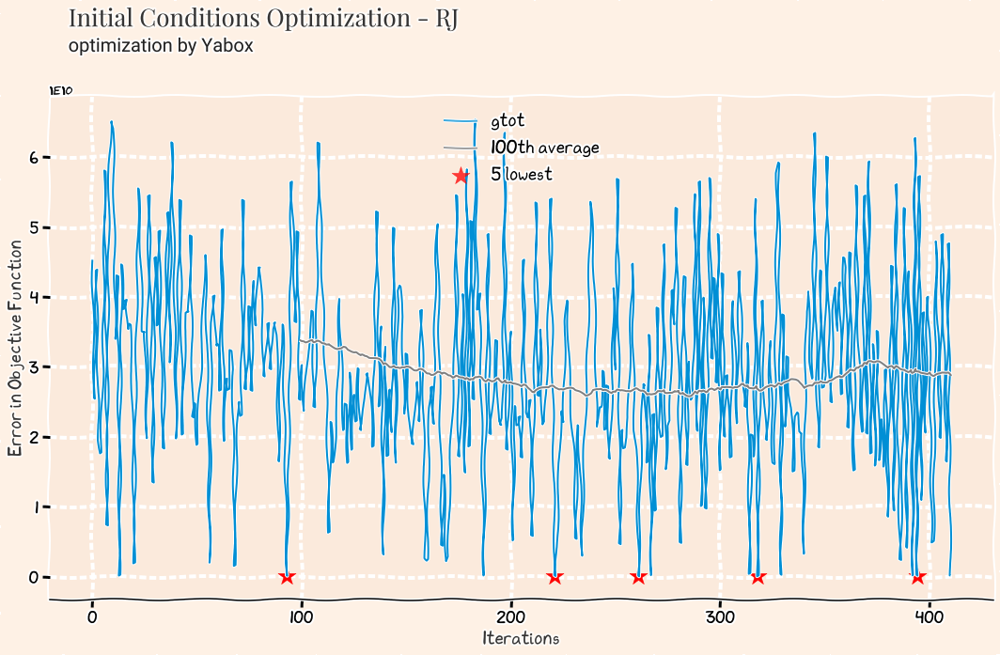

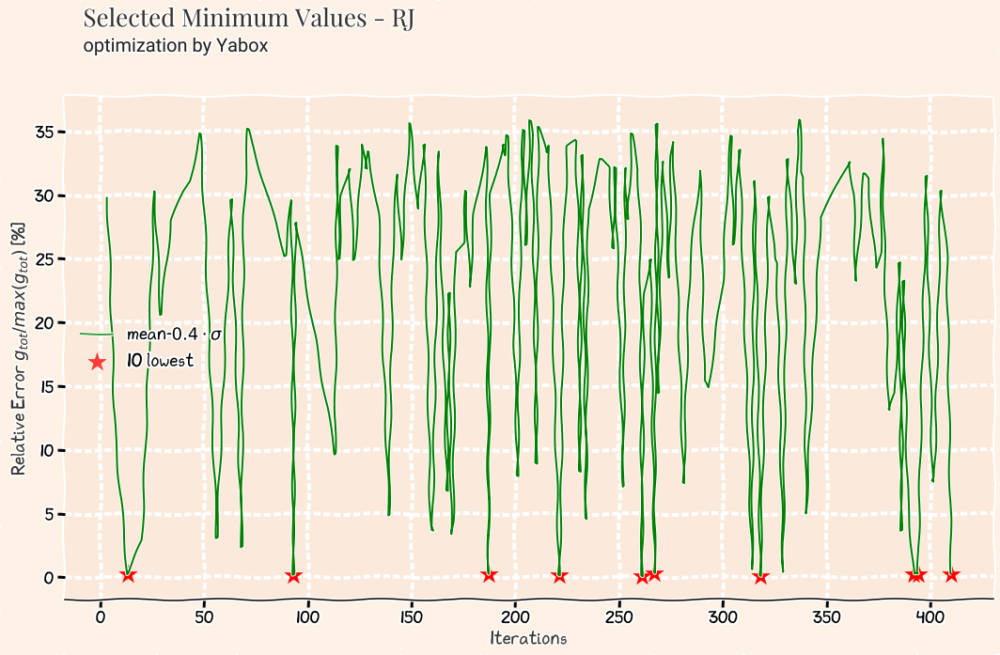

# Results for CE State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
407,1.272500e+08,2020-03-17,33,7667224,67,112,0.4114,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
407,1.272500e+08,2020-03-17,33,7667224,67,112,0.4114,0
417,1.640014e+08,2020-03-20,155,7870132,32,229,0.4170,0
169,1.973549e+08,2020-03-22,124,8739538,218,243,0.2560,0
448,2.237262e+08,2020-03-19,184,6156029,95,237,0.3629,0
315,2.494168e+08,2020-03-16,73,5566125,42,33,0.5314,0


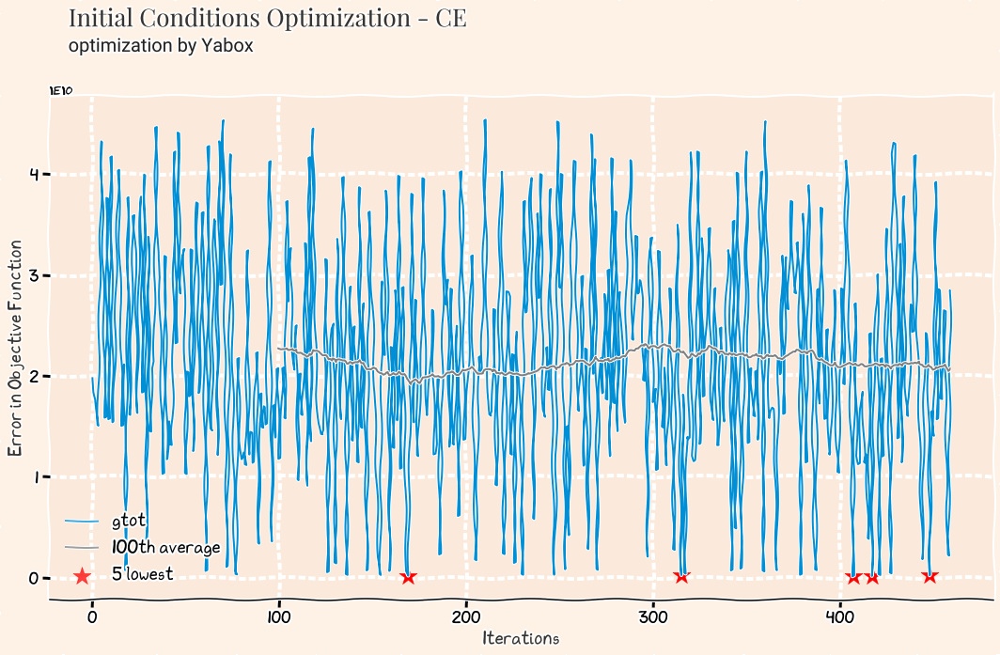

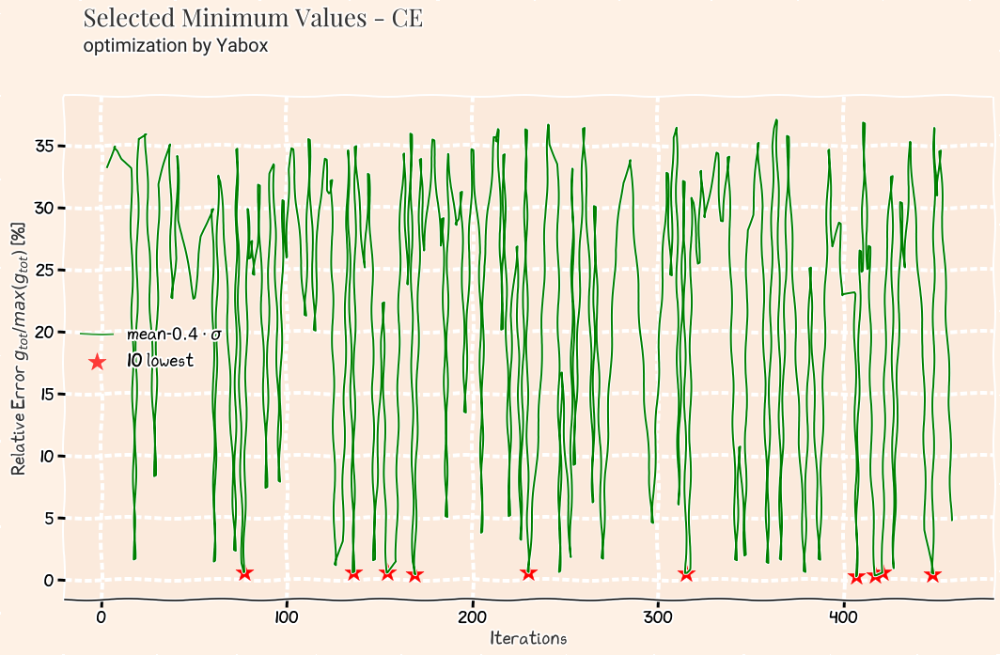

# Results for PE State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
304,1.438078e+07,2020-03-18,208,5591725,88,188,0.5481,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
304,1.438078e+07,2020-03-18,208,5591725,88,188,0.5481,0
329,1.512503e+07,2020-03-16,14,9377698,95,207,0.1917,0
251,2.243746e+07,2020-03-18,208,8743134,212,197,0.3339,0
77,2.530457e+07,2020-03-19,14,9418008,89,68,0.2557,0
203,2.818746e+07,2020-03-23,19,8002809,215,140,0.2667,0


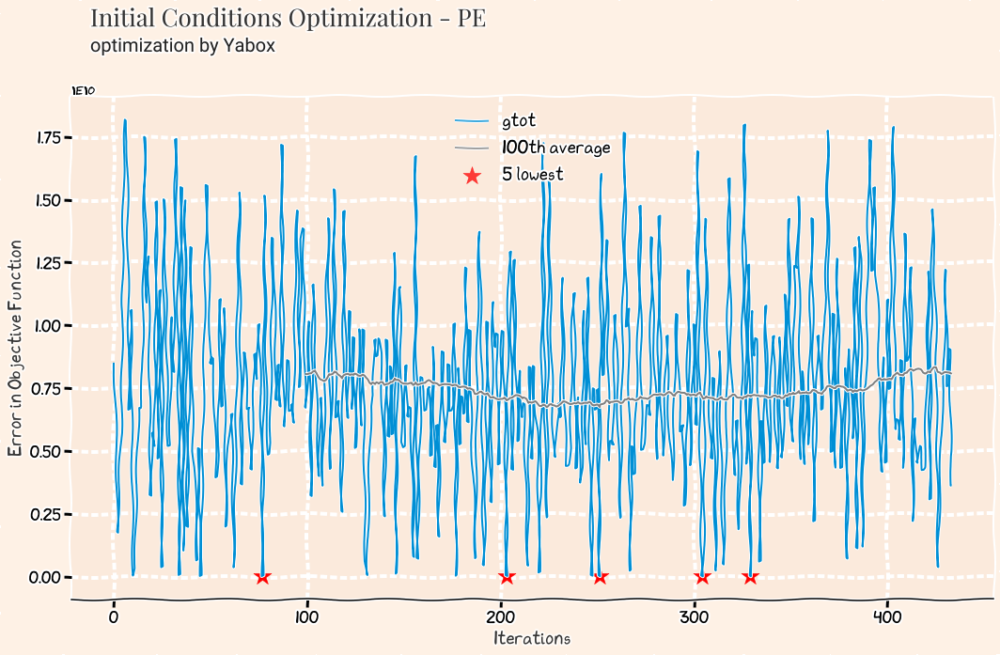

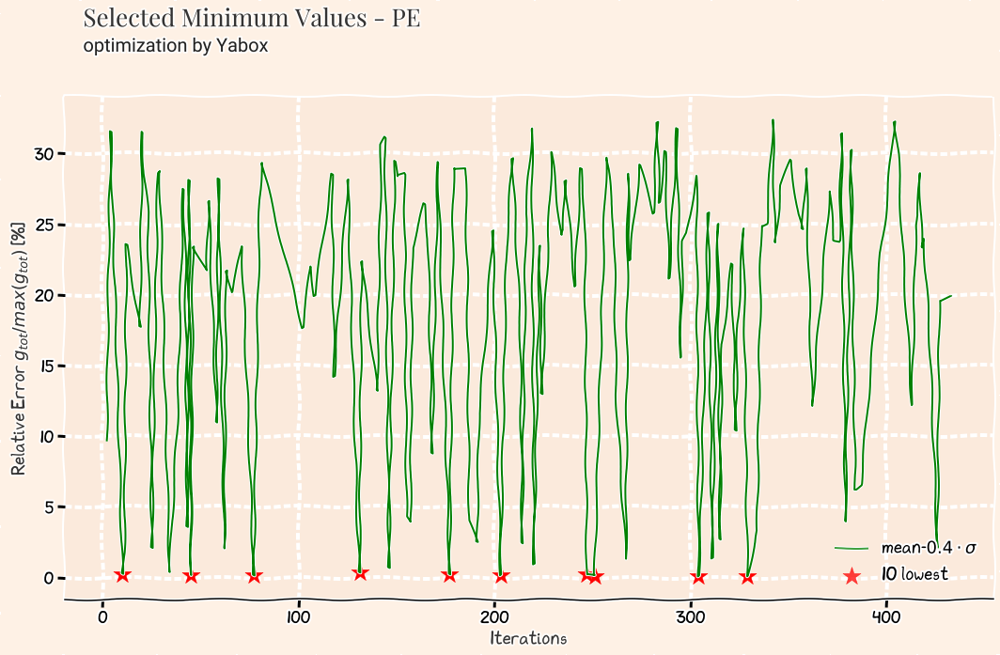

# Results for BA State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
278,4.451418e+07,2020-03-17,19,12535116,230,202,0.2369,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
278,4.451418e+07,2020-03-17,19,12535116,230,202,0.2369,0
205,7.203784e+07,2020-03-20,177,11798682,243,46,0.3109,0
326,1.295588e+08,2020-03-23,103,12734321,224,123,0.6901,0
171,1.426989e+08,2020-03-16,105,10629376,191,100,0.8279,0
382,2.853853e+08,2020-03-19,33,7721400,181,193,0.8454,0


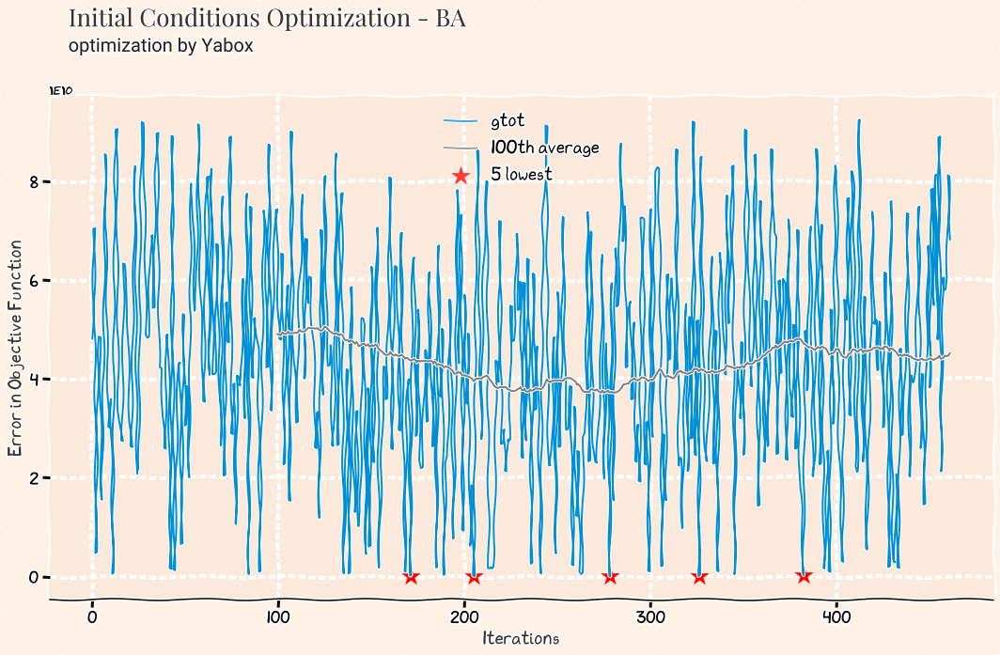

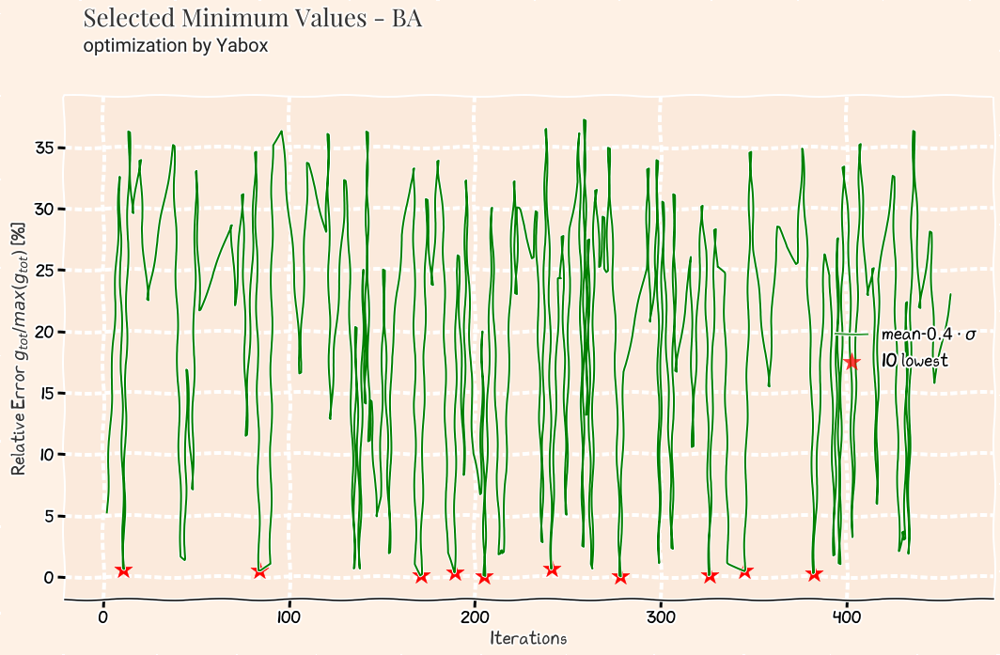

# Results for AM State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
256,1.111789e+07,2020-03-22,134,2110077,59,70,0.3215,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
256,1.111789e+07,2020-03-22,134,2110077,59,70,0.3215,0
14,4.587813e+07,2020-03-16,64,3644341,25,39,0.8268,0
175,6.363160e+07,2020-03-22,82,3030304,200,123,0.6200,0
278,6.547108e+07,2020-03-16,145,1748100,163,47,0.4145,0
279,6.762881e+07,2020-03-22,217,3259036,192,223,0.6999,0


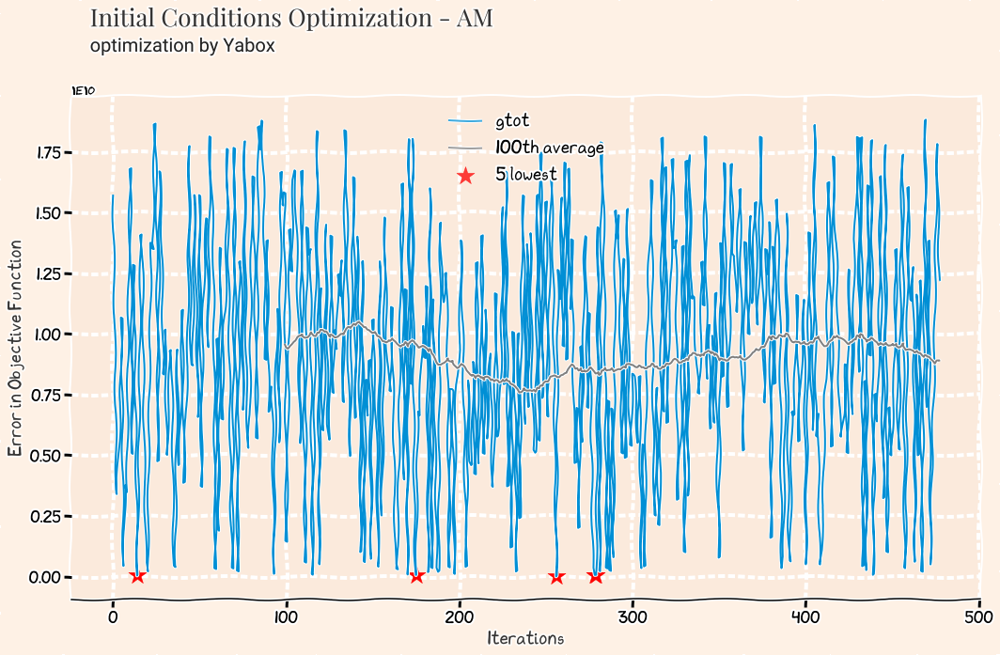

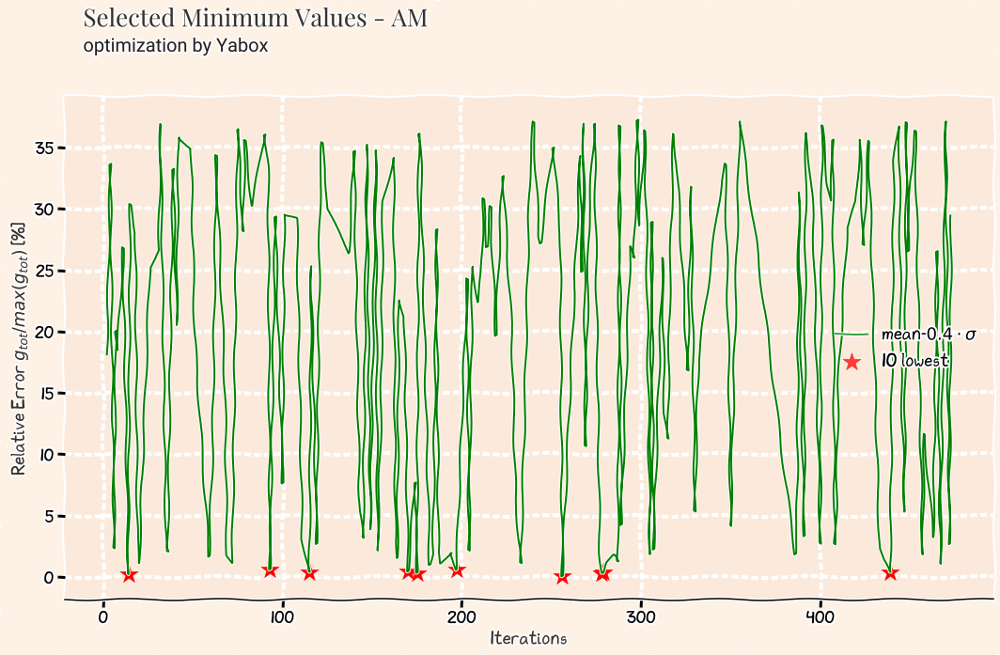

# Results for PA State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
384,1.766421e+07,2020-03-18,75,4714263,186,73,0.4269,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
384,1.766421e+07,2020-03-18,75,4714263,186,73,0.4269,0
112,2.113440e+07,2020-03-17,139,7333201,139,88,0.3852,0
232,3.382646e+07,2020-03-19,218,5107675,249,84,0.3852,0
190,3.963837e+07,2020-03-17,144,6236044,121,232,0.5507,0
192,9.786973e+07,2020-03-18,179,3077962,184,11,0.1900,0


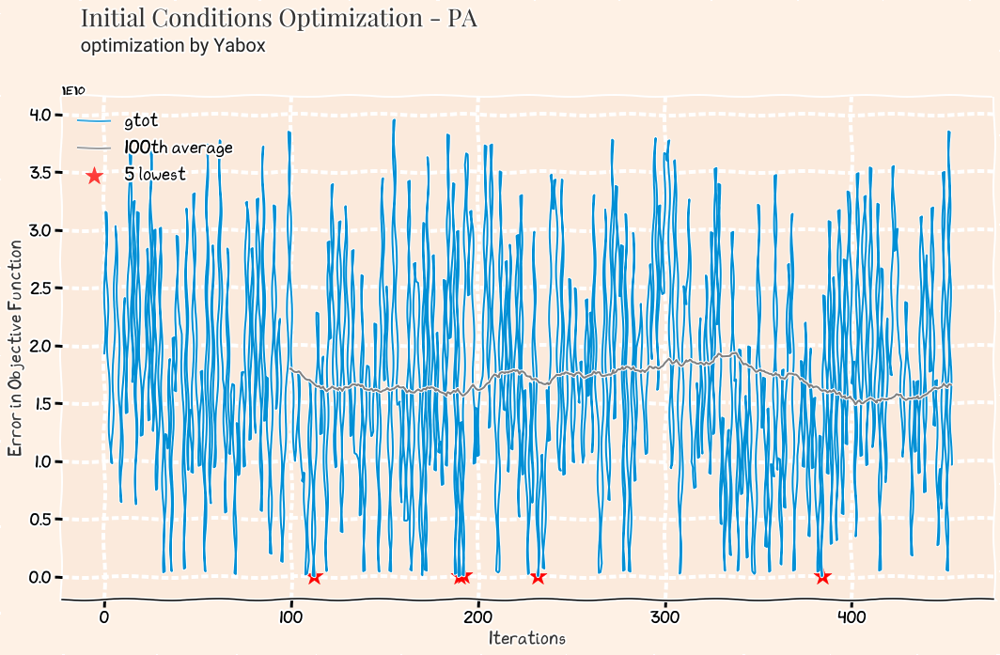

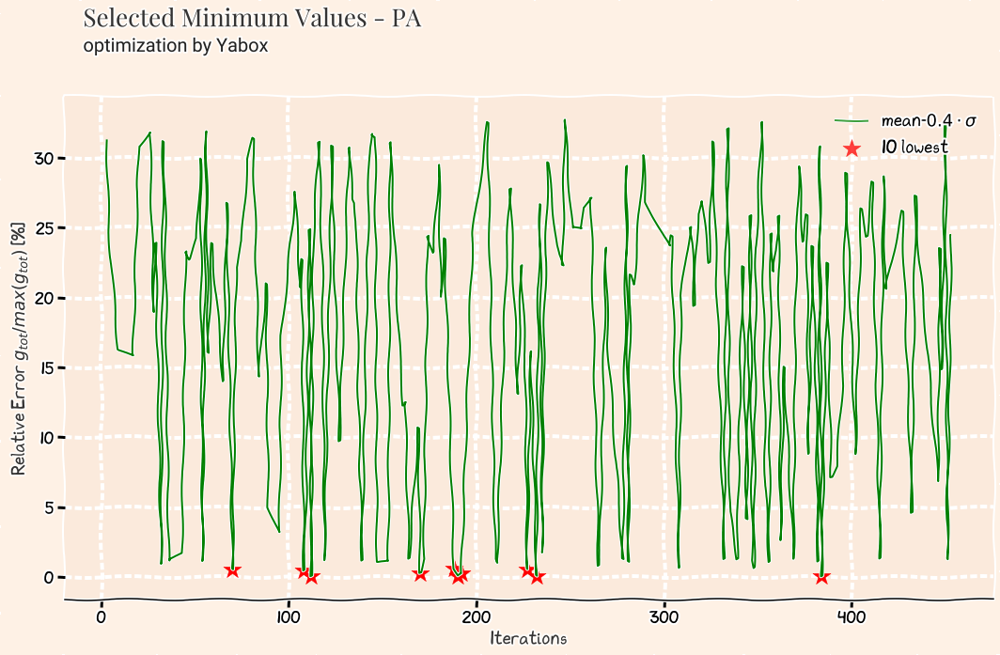

# Results for PI State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
407,1.389671e+06,2020-03-19,133,1611130,139,132,0.811,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
407,1.389671e+06,2020-03-19,133,1611130,139,132,0.8110,0
136,2.803031e+06,2020-03-19,81,1880447,41,204,0.4742,0
1,1.256728e+07,2020-03-23,38,2328365,195,59,0.4801,0
120,1.857449e+07,2020-03-16,204,2920658,103,62,0.2481,0
294,2.685840e+07,2020-03-21,213,2827974,118,117,0.5626,0


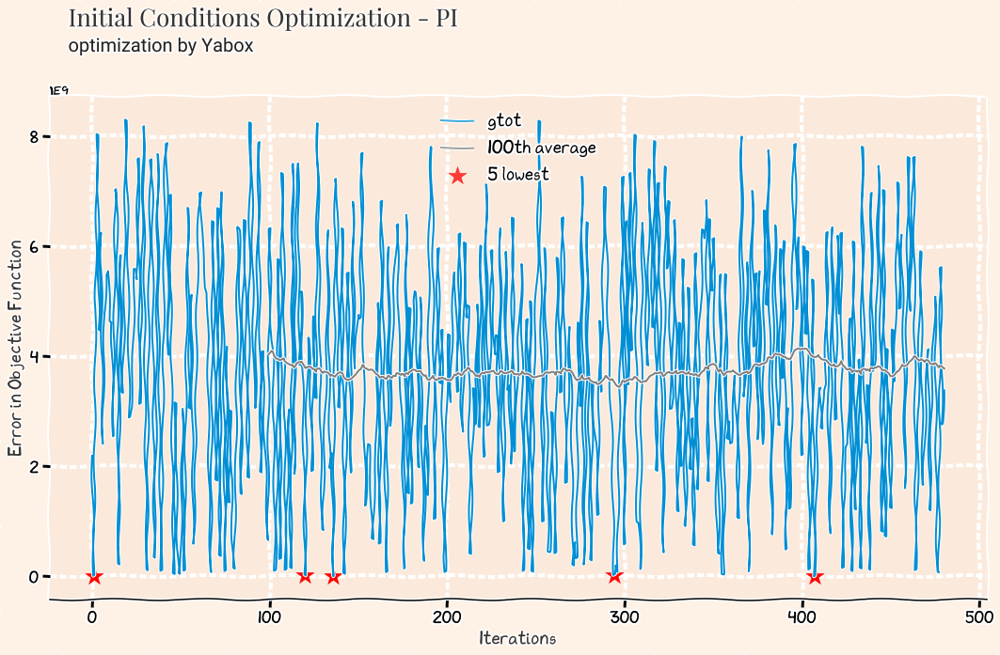

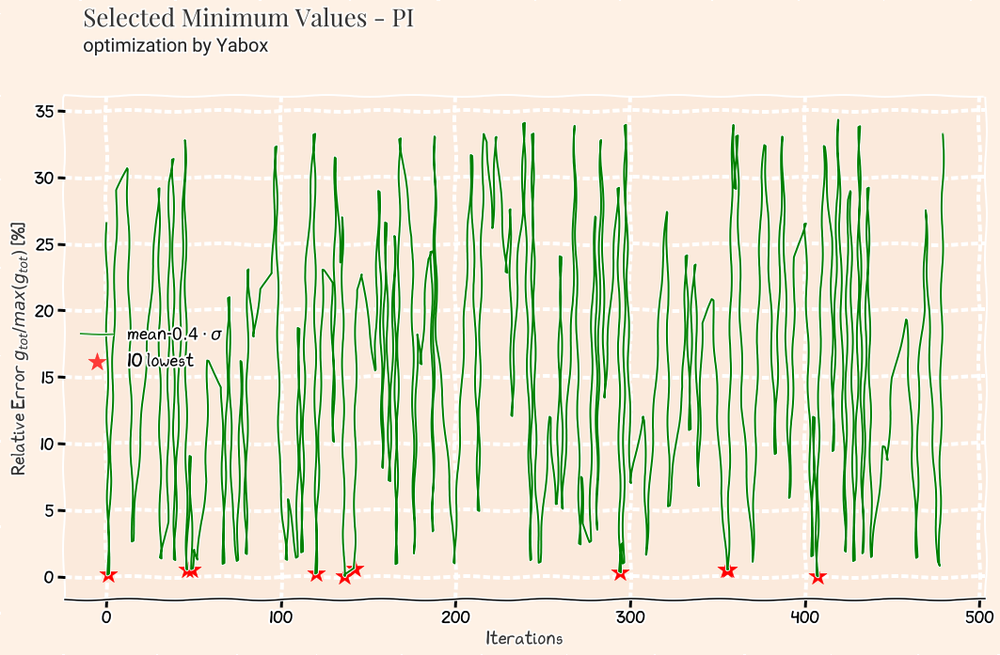

# Results for RR State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
207,1.205400e+06,2020-03-23,153,573165,215,207,0.2728,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
207,1.205400e+06,2020-03-23,153,573165,215,207,0.2728,0
8,1.583790e+06,2020-03-23,211,557751,107,220,0.3750,0
12,1.682163e+06,2020-03-20,133,283111,223,248,0.6737,0
415,1.973724e+06,2020-03-21,37,217225,27,220,0.4061,0
38,2.111950e+06,2020-03-22,211,557751,107,86,0.3765,0


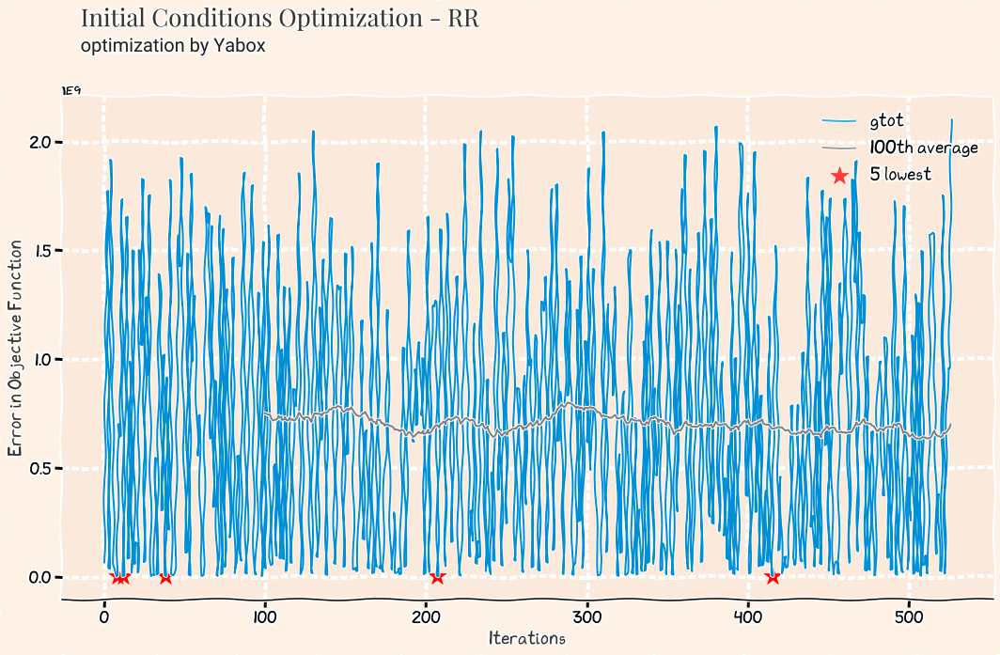

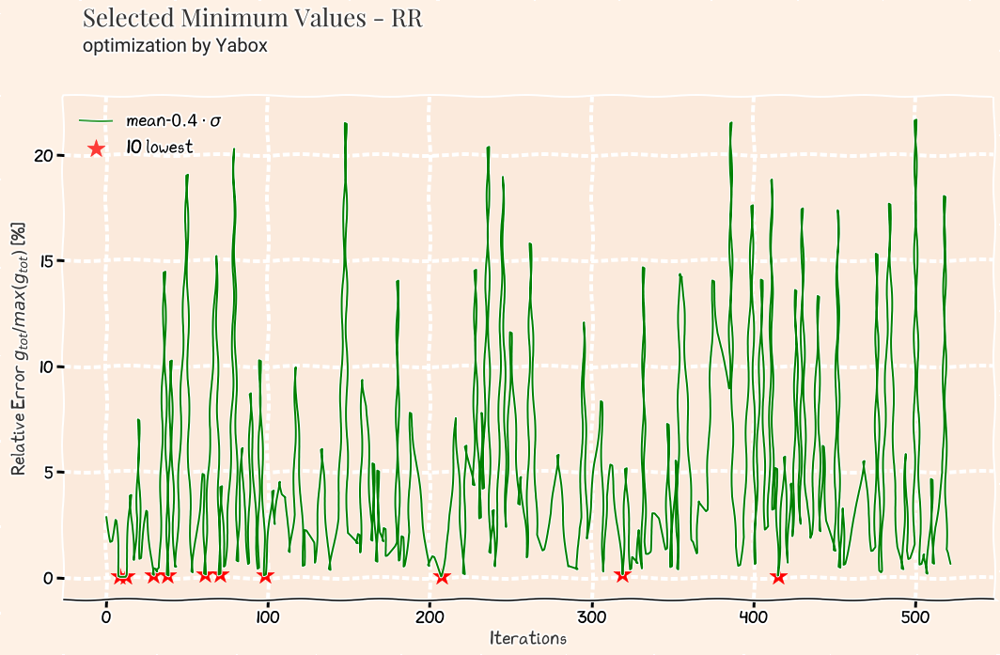

# Results for AP State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
98,2.446381e+06,2020-03-16,245,309606,173,188,0.4219,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
98,2.446381e+06,2020-03-16,245,309606,173,188,0.4219,0
174,2.664433e+06,2020-03-20,186,304479,182,59,0.2517,0
420,3.030832e+06,2020-03-20,4,816534,59,50,0.4063,0
424,3.314600e+06,2020-03-18,154,635980,84,239,0.2339,0
195,3.968568e+06,2020-03-19,208,718145,126,235,0.2426,0


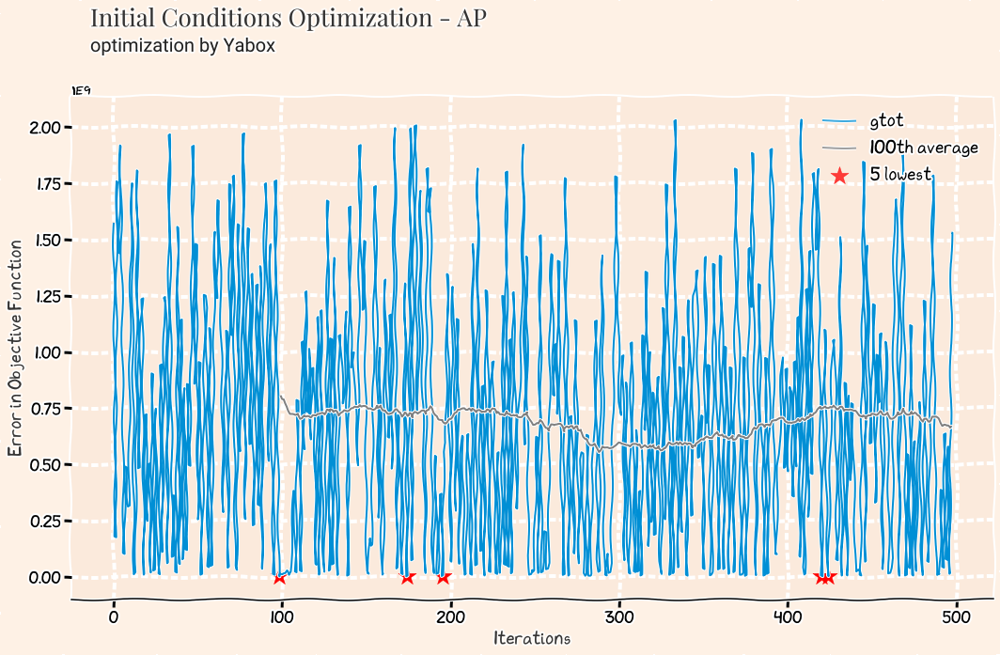

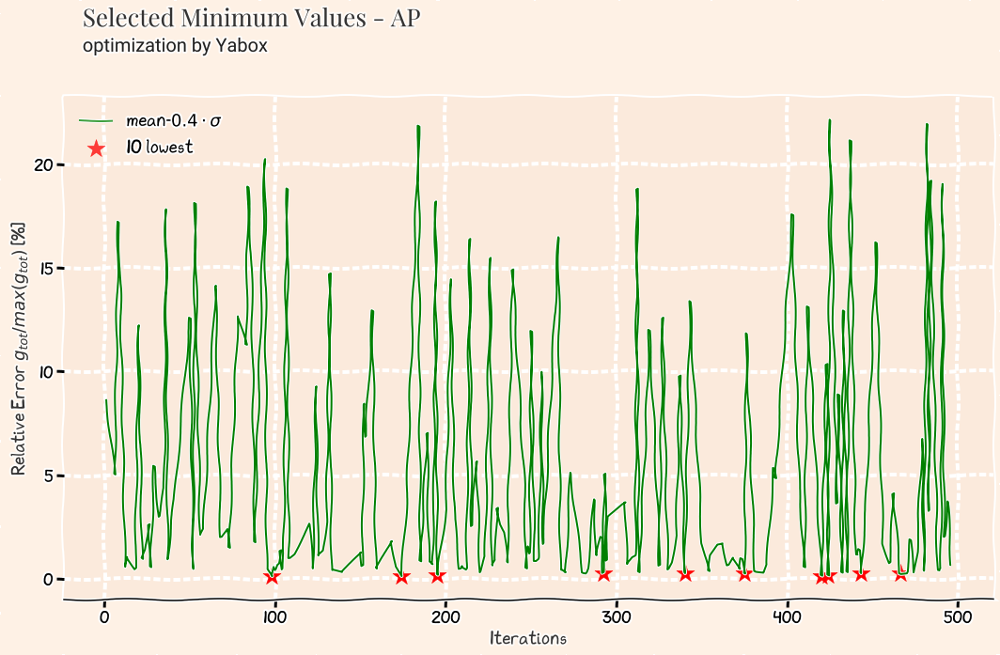

# Results for PR State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
336,1.546818e+08,2020-03-18,84,7315612,79,183,0.5874,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
336,1.546818e+08,2020-03-18,84,7315612,79,183,0.5874,0
87,1.953876e+08,2020-03-19,15,7408347,52,83,0.7134,0
70,3.260417e+08,2020-03-17,190,9956041,95,174,0.4213,0
264,3.345674e+08,2020-03-20,137,4753939,87,180,0.3777,0
110,3.977665e+08,2020-03-20,158,5566857,80,1,0.3634,0


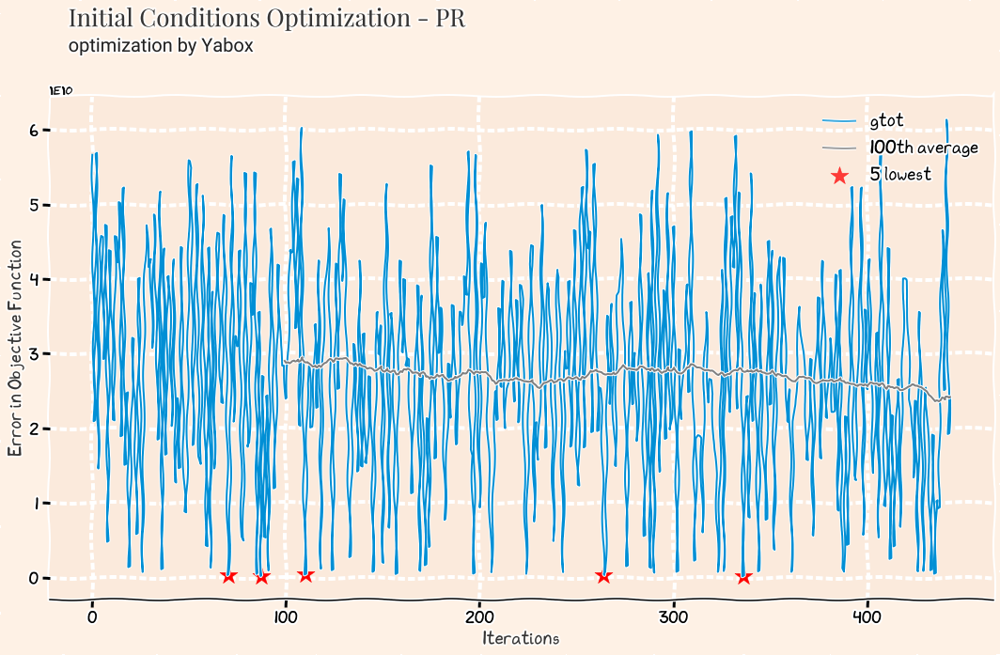

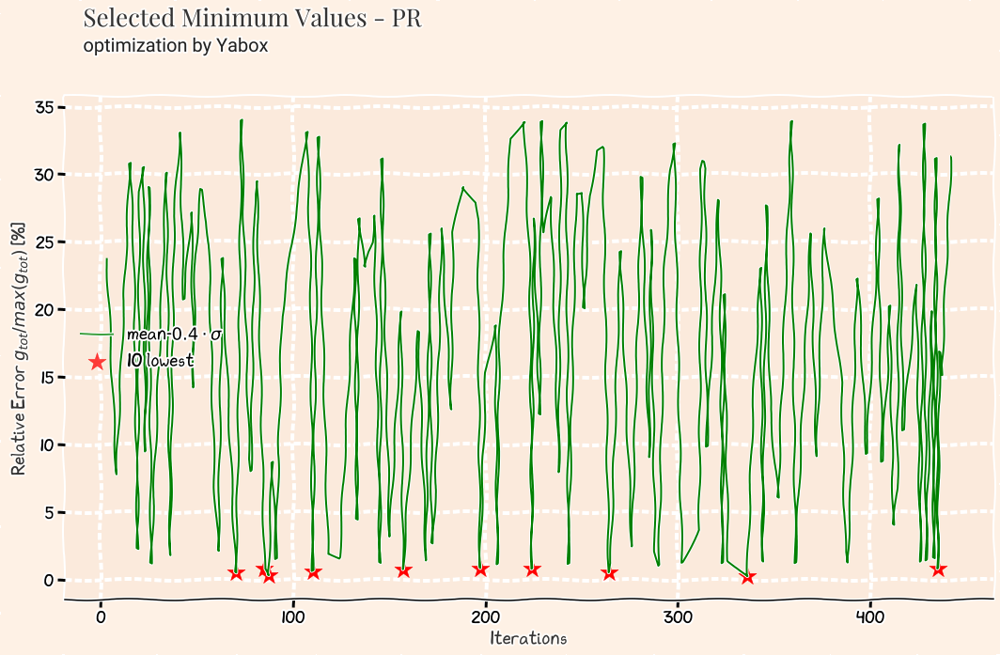

# Results for SC State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
132,9.790046e+07,2020-03-17,120,6380999,161,200,0.2312,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
132,9.790046e+07,2020-03-17,120,6380999,161,200,0.2312,0
75,1.282851e+08,2020-03-19,201,4472813,226,124,0.2247,0
290,1.543533e+08,2020-03-18,95,5050338,29,64,0.3464,0
144,2.132741e+08,2020-03-20,220,4671727,113,109,0.3616,0
209,2.372630e+08,2020-03-19,107,5614110,35,191,0.2566,0


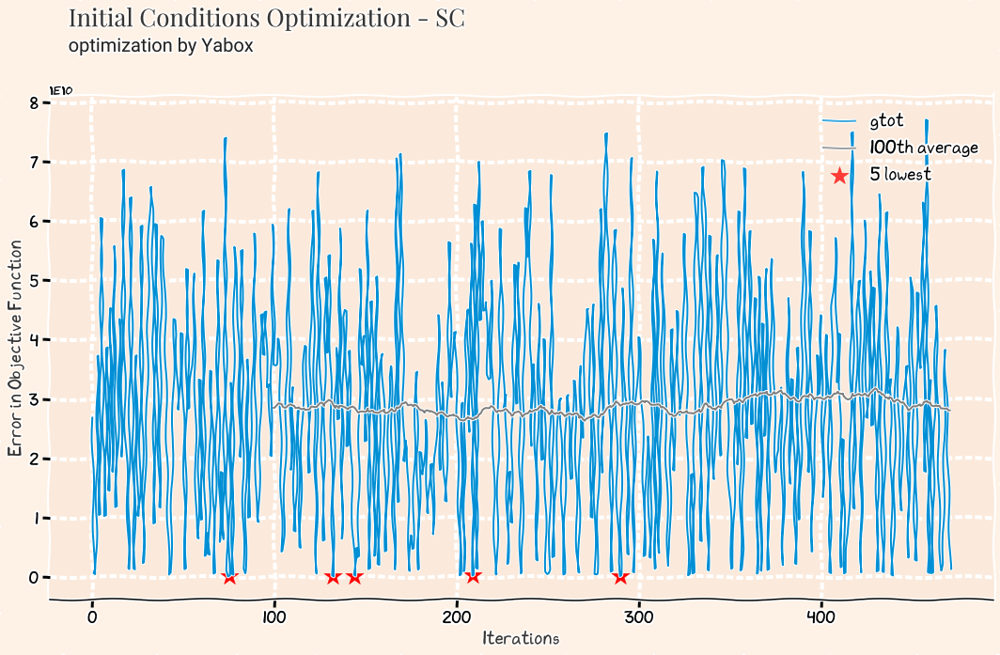

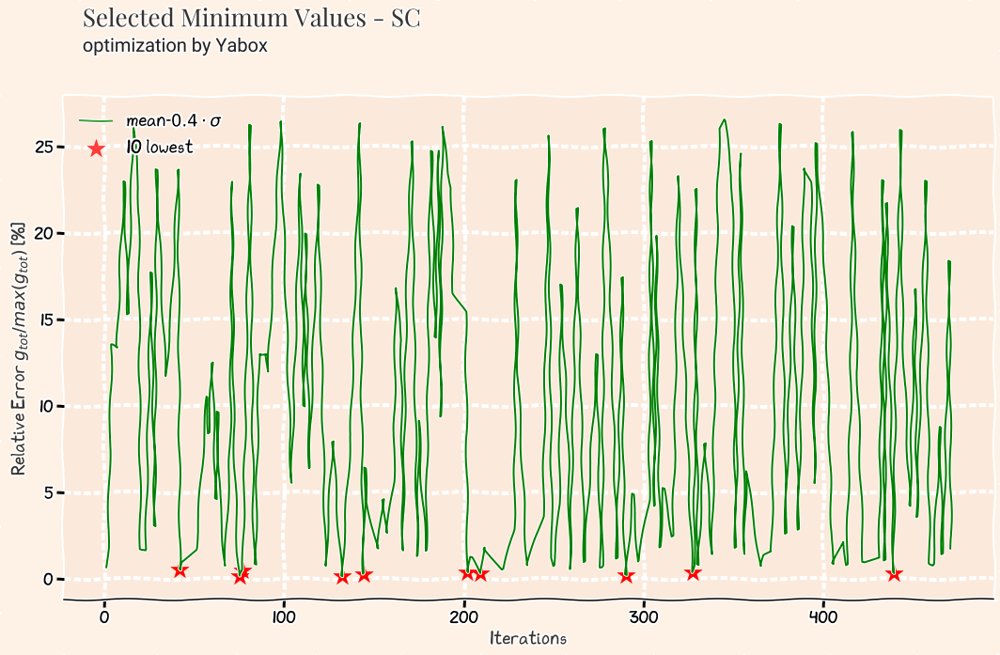

# Results for RS State

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
131,9.034573e+07,2020-03-19,163,5233159,73,2,0.67,0


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
131,9.034573e+07,2020-03-19,163,5233159,73,2,0.6700,0
377,1.600973e+08,2020-03-21,232,7626588,221,79,0.4196,0
409,2.668580e+08,2020-03-16,125,3931170,248,222,0.3233,0
329,3.592981e+08,2020-03-20,130,4270705,25,13,0.6630,0
366,3.627799e+08,2020-03-22,27,9360203,200,200,0.3485,0


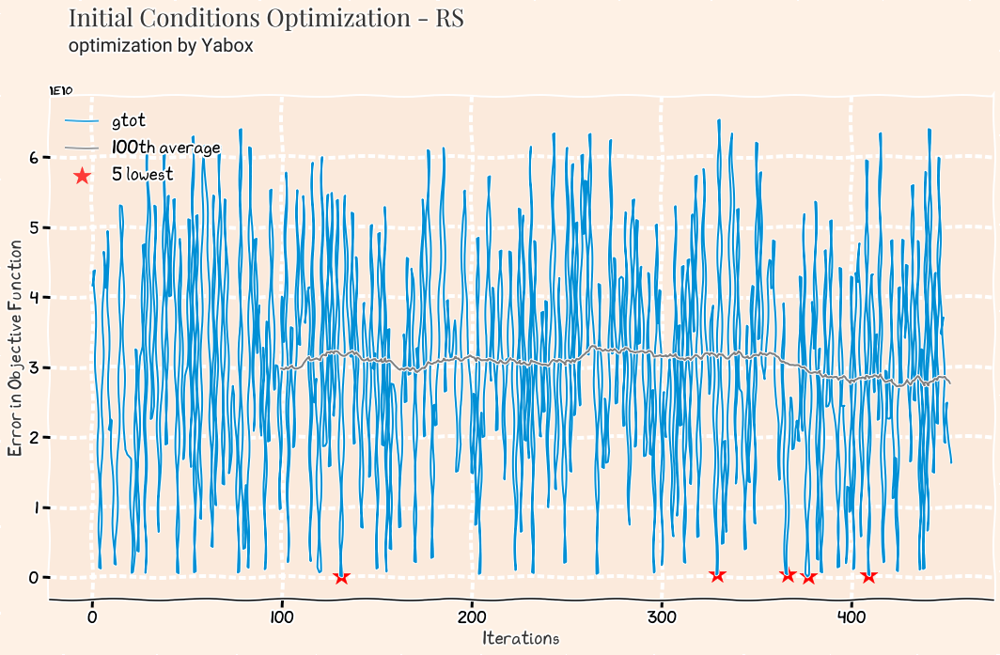

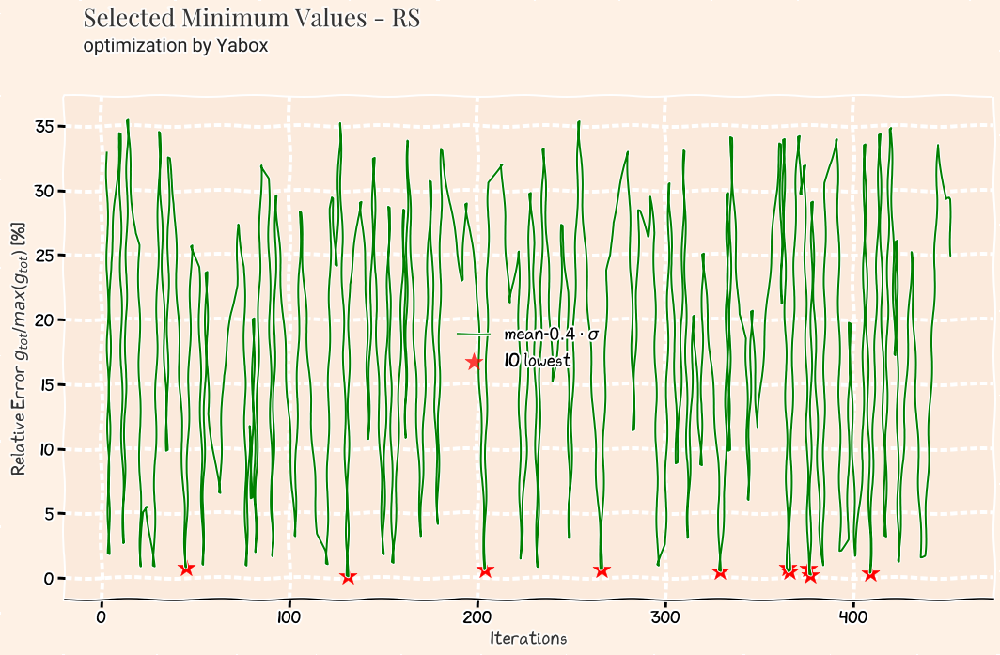

In [195]:
ggtot=[]
for state in states:
    versionStr=str(version)
    dateparse = lambda x: datetime.strptime(x, ' %Y-%m-%d')
    histOptAll= pd.read_table('./results/history_'+state+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["state","gtot",\
            "s0","startdate","i0","d0","startNcases","wcases","wrec"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","wcases","wrec"]]      
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
#     histOptAll['gtot'] = histOptAll['gtot'].apply(lambda x: int(x+0.5))
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    display(Markdown("# Results for "+state+" State"))
    display(histOpt.iloc[:,0:8])
    histOpt.to_csv("data/vars_optimized_"+state+model+"HistMin.csv", sep=","
                   , index=False)
        
    #current parameters
    query = dfparam.query('state == "{}"'.format(state)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    if len(parameters)>12:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec,popEst = parameters
    else:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
#     dfparam.at[j, "r0"] = histOpt.s0*0.25
    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam['i0'] = dfparam['i0'].astype(int)
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "START"] = histOpt.startNcases
    
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['e0'].astype(int)
    dfparam['r0'] = dfparam['r0'].astype(int)
    dfparam['d0'] = dfparam['d0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].astype(int)
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%Y-%m-%d').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    
    dfparam.r0=0
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin"+versionStr+".csv", sep=",", index=False)
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)
    
    ggtot.append(histOpt.gtot.values[0])
    
    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:8]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='red',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average",c='gray')

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.14, s = "Initial Conditions Optimization - "+state,
                    fontsize = 26, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.09,
                    s = "optimization by "+model,
                    fontsize = 20, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+state+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:8]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
        y=histMin.error[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
                
        ax.plot(x, y, label="mean-$0.4 \cdot \sigma$",c='green')
        histMin2=histMin.nsmallest(10, ['gtot']).sort_values('gtot')
        ax.scatter(histMin2.index, histMin2.gtot/histMin.gtot.max()*100,
                   label="10 lowest",c='red',marker='*',s=400)
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", 
                   fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.14, s = "Selected Minimum Values - "+state,
                    fontsize = 26, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.09,
                    s = "optimization by "+model,
                    fontsize = 20, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+state+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()

In [196]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam["gtot"] = pd.Series(ggtot)
gtot_min=dfparam.gtot.min()
gtot_max=dfparam.gtot.max()
gtot_range=gtot_max-gtot_min
gtot_mean=dfparam.gtot.mean()
gtot_std=dfparam.gtot.std()

dfparam['gtot'] = dfparam['gtot'].astype(int)
dfparam['RATIO'] = 0.0
dfparam['RATIO'] = dfparam['RATIO'].round(decimals=2)

gtot_high=(gtot_mean)/gtot_range
gtot_low=abs(gtot_mean-gtot_std)/gtot_range

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','d0','gtot'],low=gtot_low/2.74,high=gtot_high/100)
display(s)

# Final Results for Initial Conditions

## Yabox optimization model

,state,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC,gtot
0,SP,2020-03-11,200,25252852,0,0,106,0,74,132,0.000000,0.273000,0.000000,3289988399
1,ES,2020-04-02,200,1741035,0,0,51,0,172,127,0.000000,0.206500,0.000000,39383011
2,MG,2020-04-04,200,8771135,0,0,66,0,68,233,0.000000,0.247100,0.000000,89743957
3,RJ,2020-03-20,200,16171937,0,0,149,0,124,98,0.000000,0.538600,0.000000,50849188
4,CE,2020-03-17,200,7667224,0,0,67,0,112,33,0.000000,0.411400,0.000000,127249985
5,PE,2020-03-18,200,5591725,0,0,88,0,188,208,0.000000,0.548100,0.000000,14380779
6,BA,2020-03-17,200,12535116,0,0,230,0,202,19,0.000000,0.236900,0.000000,44514175
7,AM,2020-03-22,200,2110077,0,0,59,0,70,134,0.000000,0.321500,0.000000,11117886
8,PA,2020-03-18,200,4714263,0,0,186,0,73,75,0.000000,0.426900,0.000000,17664211
9,PI,2020-03-19,200,1611130,0,0,139,0,132,133,0.000000,0.811000,0.000000,1389670
